In [1]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
torch:  2.3 ; cuda:  cu121
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-sswa4thb
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-sswa4thb
  Resolved https://github.com/facebookresearch/detectron2.git to commit e8806d607403cf0f2634d4c5ac464109fdc7d4af
  Preparing metadata (setup.py) ... done


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [6]:
!curl -L "https://app.roboflow.com/ds/rp3TWzmq5z?key=58oOErhAJP" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   2913      0 --:--:-- --:--:-- --:--:--  2906
100 14.3M  100 14.3M    0     0  5891k      0  0:00:02  0:00:02 --:--:-- 12.2M
Archive:  roboflow.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
   creating: test/
 extracting: test/20240528_115146_png.rf.526a57aef66deb34888227e35adea5e3.jpg  
 extracting: test/20240528_122124_png.rf.3f2004bf0bb1d790e748200d9f95f417.jpg  
 extracting: test/20240528_124058_png.rf.852d7dd5c2334d47262534b9cdd7da86.jpg  
 extracting: test/20240528_143247_png.rf.a0cd0b6c4d1eb4598db551a30a60aa2e.jpg  
 extracting: test/20240528_144745_png.rf.e1eeb116af9d9382dfc3070e8c76ef14.jpg  
 extracting: test/20240528_150031_png.rf.c636febcbbdff2bcf0e4bacbeed1dece.jpg  
  inflating: test/_annotations.coco.json  
   creating: train/
 extracting: train/2024

In [7]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_data_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_data_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [06/19 22:37:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/19 22:37:07 d2.data.datasets.coco]: Loaded 159 images in COCO format from /content/train/_annotations.coco.json


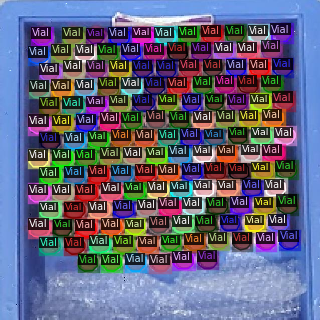

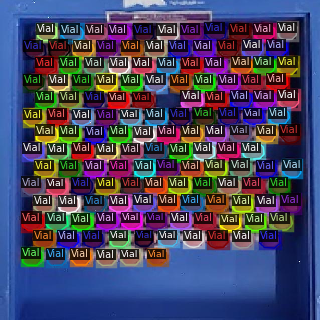

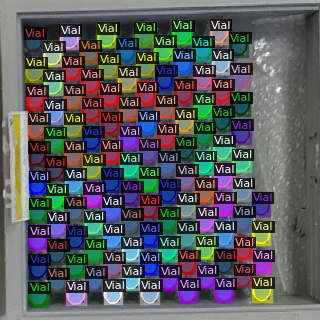

In [8]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_data_train")
dataset_dicts = DatasetCatalog.get("my_data_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [9]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_data_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR
cfg.SOLVER.MAX_ITER = 100   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[06/19 22:37:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:00, 200MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[06/19 22:37:29 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[06/19 22:37:42 d2.utils.events]:  eta: 0:00:30  iter: 19  total_loss: 2.162  loss_cls: 1.577  loss_box_reg: 0.3647  loss_rpn_cls: 0.1678  loss_rpn_loc: 0.1082    time: 0.3813  last_time: 0.3549  data_time: 0.0257  last_data_time: 0.0050   lr: 0.00047703  max_mem: 3430M
[06/19 22:37:53 d2.utils.events]:  eta: 0:00:22  iter: 39  total_loss: 1.228  loss_cls: 0.4436  loss_box_reg: 0.4632  loss_rpn_cls: 0.1065  loss_rpn_loc: 0.1914    time: 0.3903  last_time: 0.3507  data_time: 0.0151  last_data_time: 0.0147   lr: 0.00097653  max_mem: 3969M
[06/19 22:38:00 d2.utils.events]:  eta: 0:00:14  iter: 59  total_loss: 0.6559  loss_cls: 0.08834  loss_box_reg: 0.352  loss_rpn_cls: 0.0302  loss_rpn_loc: 0.1781    time: 0.3730  last_time: 0.3952  data_time: 0.0065  last_data_time: 0.0051   lr: 0.001476  max_mem: 3969M
[06/19 22:38:07 d2.utils.events]:  eta: 0:00:07  iter: 79  total_loss: 0.6238  loss_cls: 0.1361  loss_box_reg: 0.2985  loss_rpn_cls: 0.02182  loss_rpn_loc: 0.1838    time: 0.3732  last_t

In [10]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [11]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_data_test", )
predictor = DefaultPredictor(cfg)

[06/19 22:40:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [12]:
test_metadata = MetadataCatalog.get("my_data_test")

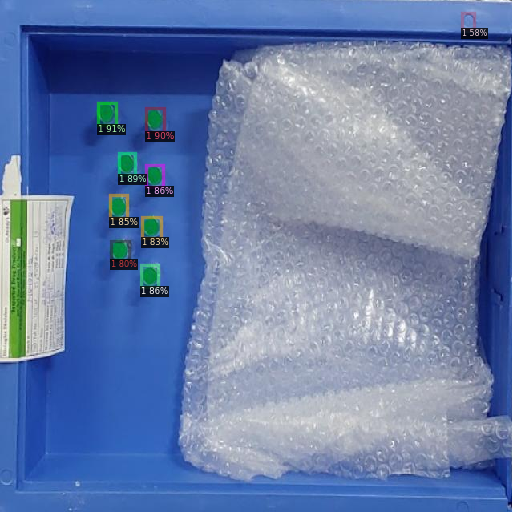

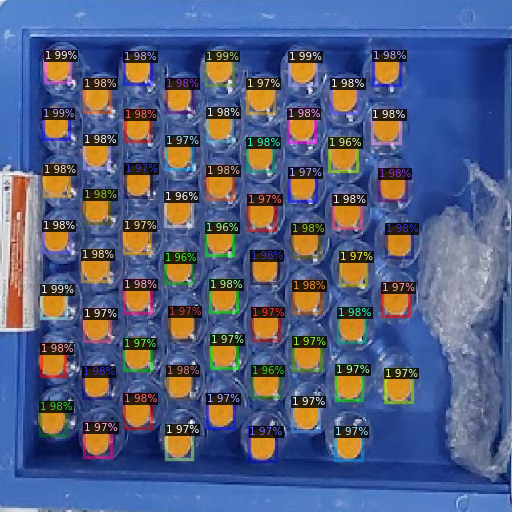

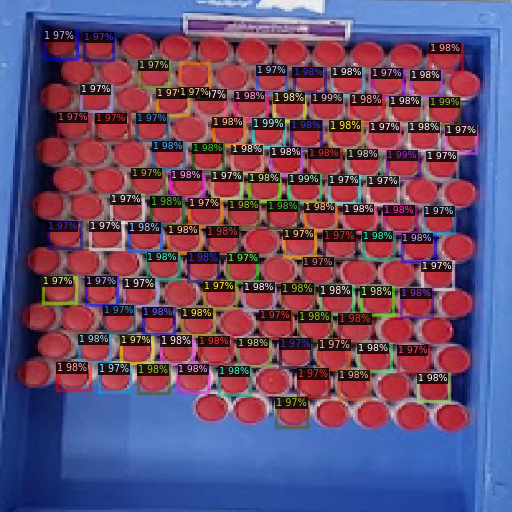

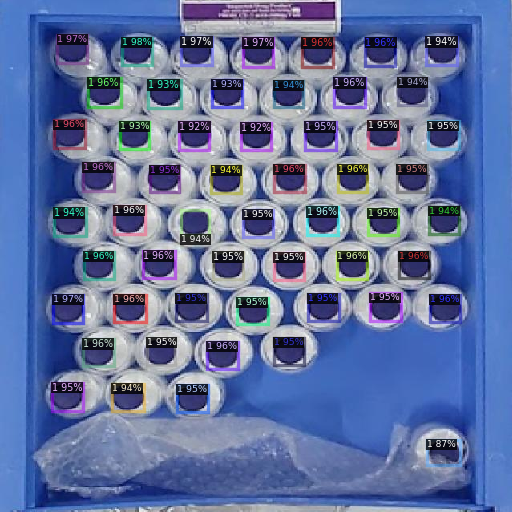

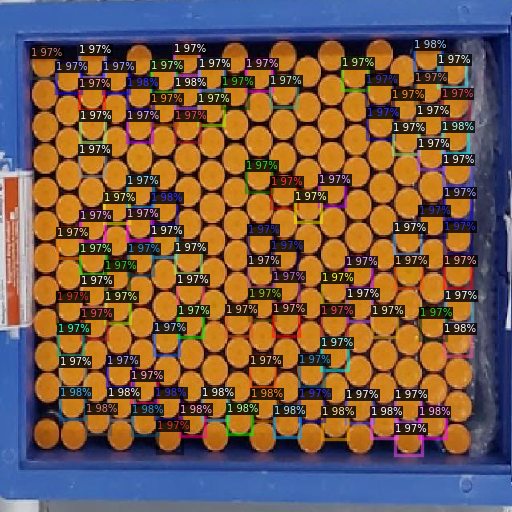

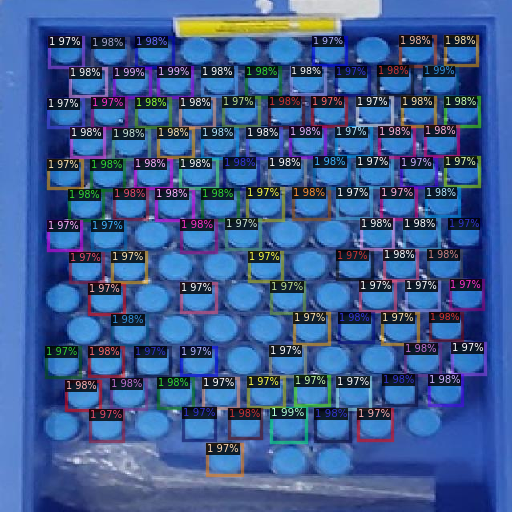

In [13]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])


In [14]:
f=open('config.yaml','w')
f.write(cfg.dump())
f.close()